In [1]:
!pip install grad-cam captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 58.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 50.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.5 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=e7e312756a998dc56f852ebef347c5b4c45999bab168c348e3139a94a30568e

In [2]:
import torch,cv2,os,time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from captum.metrics import infidelity
from sklearn.model_selection import train_test_split
from captum.attr import IntegratedGradients, Saliency
from transformers import BlipProcessor, BlipForConditionalGeneration
from pytorch_grad_cam import (
    GradCAM, HiResCAM, GradCAMElementWise, GradCAMPlusPlus, XGradCAM, AblationCAM,
    ScoreCAM, EigenCAM, EigenGradCAM, LayerCAM, FullGrad, KPCA_CAM, RandomCAM
)
from pytorch_grad_cam.metrics.road import ROADCombined
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget, ClassifierOutputSoftmaxTarget
from PIL import Image

2025-06-06 23:14:13.186156: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749251653.599744      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749251653.711586      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# === 1. Load model & processor ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "/kaggle/input/blip-flickr8k-indo-image-captioning/blip-image-captioning-large"
# model_path = "Salesforce/blip-image-captioning-base"
processor = BlipProcessor.from_pretrained(model_path)
model = BlipForConditionalGeneration.from_pretrained(model_path).eval().to(device)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [4]:
metadata_path = "/kaggle/input/image-caption-indonesia/metadata.csv"
image_dir = "/kaggle/input/image-caption-indonesia/Images"

In [5]:
df = pd.read_csv(metadata_path)

# Gabungkan path ke file gambar
df["image_path"] = df["file_name"].apply(lambda x: os.path.join(image_dir, x))
df

,file_name,text,image_path
0,1000268201_693b08cb0e.jpg,Seorang anak berpakaian merah muda sedang mena...,/kaggle/input/image-caption-indonesia/Images/1...
1,1000268201_693b08cb0e.jpg,Seorang gadis memasuki sebuah bangunan kayu.,/kaggle/input/image-caption-indonesia/Images/1...
2,1000268201_693b08cb0e.jpg,Seorang gadis kecil naik ke rumah bermain kayu.,/kaggle/input/image-caption-indonesia/Images/1...
3,1000268201_693b08cb0e.jpg,Seorang gadis kecil menaiki tangga menuju ruma...,/kaggle/input/image-caption-indonesia/Images/1...
4,1000268201_693b08cb0e.jpg,Seorang gadis kecil berpakaian merah muda masu...,/kaggle/input/image-caption-indonesia/Images/1...
...,...,...,...
40450,997722733_0cb5439472.jpg,Seorang pria berkemeja merah muda memanjat per...,/kaggle/input/image-caption-indonesia/Images/9...
40451,997722733_0cb5439472.jpg,Seorang pria sedang memanjat tebing tinggi di ...,/kaggle/input/image-caption-indonesia/Images/9...
40452,997722733_0cb5439472.jpg,Seseorang dengan kemeja merah memanjat permuka...,/kaggle/input/image-caption-indonesia/Images/9...
40453,997722733_0cb5439472.jpg,Seorang pemanjat tebing berbaju merah.,/kaggle/input/image-caption-indonesia/Images/9...


In [6]:
# def shorten(text, max_len=100):
#     return text if len(text) <= max_len else text[:max_len - 3] + "..."

# # === PATCH WRAPPER ===
# class BlipPatchWrapper(torch.nn.Module):
#     def __init__(self, patch_module):
#         super().__init__()
#         self.patch_module = patch_module
#     def forward(self, x):
#         return self.patch_module(x)

# # === ATTENTION ROLLOUT ===
# def compute_attention_rollout(model, pixel_values):
#     attn_maps = []
#     def hook_fn(module, input, output):
#         if isinstance(output, tuple) and output[1] is not None:
#             attn_maps.append(output[1].detach().cpu())
#     hooks = [layer.self_attn.register_forward_hook(hook_fn) for layer in model.vision_model.encoder.layers]
#     with torch.no_grad():
#         _ = model.vision_model(pixel_values, output_attentions=True)
#     for h in hooks:
#         h.remove()
#     result = torch.eye(attn_maps[0].shape[-1])
#     for attn in attn_maps:
#         attn_heads_avg = attn.mean(1)
#         attn_heads_avg += torch.eye(attn_heads_avg.size(-1))
#         attn_heads_avg /= attn_heads_avg.sum(dim=-1, keepdim=True)
#         result = torch.matmul(attn_heads_avg[0], result)
#     return result[0, 1:]

# # === FORWARD FN FOR ATTRIBUTION ===
# def forward_fn(x):
#     outputs = model.vision_model(x)
#     if isinstance(outputs, dict):
#         hidden_states = outputs["last_hidden_state"]
#     else:
#         hidden_states = outputs.last_hidden_state
#     cls_embedding = hidden_states[:, 0, :]  # CLS token
#     scalar_score = cls_embedding.norm(dim=1)  # (batch_size,) tensor
#     return scalar_score

# def evaluate_cam_drop(model, input_tensor, cam_map, mask_ratio=0.3):
#     with torch.no_grad():
#         # Skor awal (dari gambar asli)
#         orig_score = forward_fn(input_tensor).item()

#         # Resize cam map ke ukuran image (224x224) jika perlu
#         if cam_map.shape != input_tensor.shape[2:]:
#             cam_map = cv2.resize(cam_map, (input_tensor.shape[3], input_tensor.shape[2]))

#         cam_map = torch.tensor(cam_map).float()
#         cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-6)

#         # Buat mask: nolkan patch dengan attention tertinggi (hapus area penting)
#         k = int(mask_ratio * cam_map.numel())
#         flat = cam_map.flatten()
#         idx = torch.topk(flat, k).indices
#         mask = torch.ones_like(flat)
#         mask[idx] = 0
#         mask = mask.reshape(cam_map.shape)

#         # Terapkan ke input
#         mask = mask.unsqueeze(0).unsqueeze(0).to(input_tensor.device)
#         masked_input = input_tensor * mask

#         # Skor baru setelah masking
#         drop_score = forward_fn(masked_input).item()

#         drop_ratio = (orig_score - drop_score) / (orig_score + 1e-6)
#         return round(drop_ratio, 4)

# class PatchNormTarget:
#     def __call__(self, model_output):
#         return model_output.norm(dim=(1, 2))

# # ("GradCAM", GradCAM(model=wrapped_model, target_layers=[target_layer])),
# # ("EigenGradCAM", EigenGradCAM(model=wrapped_model, target_layers=[target_layer])),
# # ("GradCAM++", GradCAMPlusPlus(model=wrapped_model, target_layers=[target_layer])),
# # ("EigenGradCAM", EigenGradCAM(model=wrapped_model, target_layers=[target_layer])),
# # ("AblationCAM", AblationCAM(model=wrapped_model, target_layers=[target_layer])),
# # ("RandomCAM", RandomCAM(model=wrapped_model, target_layers=[target_layer]))

# def benchmark_blip_cam_light(input_tensor, target_layer, rgb_image):
#     methods = [
#         ("EigenCAM", EigenCAM(model=wrapped_model, target_layers=[target_layer])),
#         ("KPCA-CAM", KPCA_CAM(model=wrapped_model, target_layers=[target_layer]))
#     ]
#     cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
#     targets = [PatchNormTarget()]
#     results = []

#     # === CAM Methods ===
#     for name, cam_method in methods:
#         with cam_method:
#             attributions = cam_method(input_tensor=input_tensor, targets=targets)
#         attribution = attributions[0, :]
#         cam_h, cam_w = attribution.shape
#         rgb_resized = cv2.resize((rgb_image * 255).astype(np.uint8), (cam_w, cam_h))
#         rgb_resized = np.float32(rgb_resized) / 255

#         vis = show_cam_on_image(rgb_resized, attribution, use_rgb=True)
#         try:
#             raw_score = cam_metric(input_tensor, attributions, targets, wrapped_model)
#             score = float(np.array(raw_score).flatten()[0])
#         except Exception as e:
#             print(f"[{name}] Scoring error: {e}")
#             score = 0.0

#         vis = cv2.putText(vis, f"{name} - Score: {score:.5f}", (10, 20),
#                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
#         results.append((name, vis, score))

#     # === Attention Rollout ===
#     rollout_map = compute_attention_rollout(model, input_tensor)
#     patch_res = int(np.sqrt(rollout_map.shape[0]))
#     rollout_map = rollout_map[:patch_res**2].reshape(patch_res, patch_res).numpy()
#     rollout_map = (rollout_map - rollout_map.min()) / (rollout_map.max() - rollout_map.min())
#     rollout_map_resized = cv2.resize(rollout_map, (rgb_image.shape[1], rgb_image.shape[0]))
#     vis_rollout = show_cam_on_image(rgb_image, rollout_map_resized, use_rgb=True)
#     score_rollout = evaluate_cam_drop(model, input_tensor.clone(), rollout_map_resized)
#     vis_rollout = cv2.putText(vis_rollout, f"Attention Rollout - Score: {score_rollout:.5f}", (10, 20),
#                               cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
#     results.append(("Attention Rollout", vis_rollout, score_rollout))

#     # === Saliency Map ===
#     saliency = Saliency(forward_fn)
#     input_tensor.requires_grad_()
#     sal_attr = saliency.attribute(input_tensor)
#     sal_map = sal_attr[0].detach().cpu().permute(1, 2, 0).numpy()
#     sal_map = np.mean(np.abs(sal_map), axis=-1)
#     sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
    
#     # Resize image to match saliency map size
#     cam_h, cam_w = sal_map.shape
#     rgb_resized = cv2.resize((rgb_image * 255).astype(np.uint8), (cam_w, cam_h))
#     rgb_resized = np.float32(rgb_resized) / 255
    
#     vis_sal = show_cam_on_image(rgb_resized, sal_map, use_rgb=True)
#     score_sal = evaluate_cam_drop(model, input_tensor.clone(), sal_map)
#     vis_sal = cv2.putText(vis_sal, f"Saliency Map - Score: {score_sal:.5f}", (10, 20),
#                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
#     results.append(("Saliency Map", vis_sal, score_sal))
        
#     return results

In [7]:
# image = Image.open(df['image_path'][0]).convert("RGB")
# image_np = np.array(image).astype(np.float32) / 255.0
# inputs = processor(images=image, return_tensors="pt").to(device)
# input_tensor = inputs["pixel_values"]

# # Run the benchmark
# target_layer = model.vision_model.embeddings.patch_embedding
# wrapped_model = BlipPatchWrapper(target_layer)
# results = benchmark_blip_cam_light(input_tensor, target_layer, image_np)

# for name, img, score in results:
#     plt.figure(figsize=(6, 6))
#     plt.imshow(img)
#     plt.axis("off")
#     plt.title(f"{name} (Score: {score:.3f})")
#     plt.show()

In [8]:
# # Pertama, pisahkan menjadi train dan test
# df = pd.read_csv('/kaggle/input/image-caption-indonesia/metadata.csv')
# df.rename(columns={"file_name": "Images","text": "Caption"}, inplace=True)
# df = df.sort_values(by="Images")
# # --- 1. Load data ---
# df_eval = pd.read_csv("/kaggle/input/best-blip-flickr8kindo/model_evaluation_results (1).csv")    # dataframe hasil evaluasi caption
# df_ref = df        # dataframe dengan kolom Images & Caption

# # --- 2. Ekstrak nama file dari path lengkap di df_eval ---
# df_eval["Image_Name"] = df_eval["Filename"].apply(lambda x: x.split("/")[-1])

# # Gabungkan dengan referensi caption
# df_merged = pd.merge(
#     df_eval,
#     df_ref,
#     left_on=["Image_Name", "Ref Caption"],
#     right_on=["Images", "Caption"],
#     how="inner"
# )

# # Hitung skor total
# df_merged["Total_Score"] = 0.5 * df_merged["BLEU Score"] + 0.5 * df_merged["BERTScorer F1"]

# # Ambil caption terbaik per (Images, Caption)
# df_best = df_merged.sort_values(by="Total_Score", ascending=False).drop_duplicates(subset=["Images", "Caption"])
# df_best["Image_Path"] = df_merged["Image_Name"].apply(lambda x: os.path.join(image_dir, x))
# # Sisakan hanya kolom Images dan Caption
# df = df_best[["Images", "Caption","Image_Path"]]
# df

In [9]:
# Pertama, pisahkan menjadi train dan test
df = pd.read_csv('/kaggle/input/image-caption-indonesia/metadata.csv')
df.rename(columns={"file_name": "Images","text": "Caption"}, inplace=True)
df = df.sort_values(by="Images")
# --- 1. Load data ---
df_eval = pd.read_csv("/kaggle/input/best-blip-flickr8kindo/model_evaluation_results (1).csv")    # dataframe hasil evaluasi caption
df_ref = df        # dataframe dengan kolom Images & Caption

# --- 2. Ekstrak nama file dari path lengkap di df_eval ---
df_eval["Image_Name"] = df_eval["Filename"].apply(lambda x: x.split("/")[-1])

# Gabungkan dengan referensi caption
df_merged = pd.merge(
    df_eval,
    df_ref,
    left_on=["Image_Name", "Ref Caption"],
    right_on=["Images", "Caption"],
    how="inner"
)

# Hitung skor total
df_merged["Total_Score"] = 0.5 * df_merged["BLEU Score"] + 0.5 * df_merged["BERTScorer F1"]

# Ambil caption terbaik per (Images, Caption)
df_best = df_merged.sort_values(by="Total_Score", ascending=False).drop_duplicates(subset=["Images", "Caption"])
df_best["Image_Path"] = df_merged["Image_Name"].apply(lambda x: os.path.join(image_dir, x))
# Sisakan hanya kolom Images dan Caption
df = df_best[["Images", "Caption","Image_Path"]]
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df = df_test

In [10]:
# # === Supporting Classes and Functions
# class BlipPatchWrapper(torch.nn.Module):
#     def __init__(self, patch_module):
#         super().__init__()
#         self.patch_module = patch_module
#     def forward(self, x):
#         return self.patch_module(x)

# class PatchNormTarget:
#     def __call__(self, model_output):
#         return model_output.norm(dim=(1, 2))

# def forward_fn(x):
#     outputs = model.vision_model(x)
#     hidden_states = outputs.last_hidden_state if hasattr(outputs, 'last_hidden_state') else outputs["last_hidden_state"]
#     return hidden_states[:, 0, :].norm(dim=1)

# def compute_attention_rollout(model, pixel_values):
#     attn_maps = []
#     def hook_fn(module, input, output):
#         if isinstance(output, tuple) and output[1] is not None:
#             attn_maps.append(output[1].detach().cpu())
#     hooks = [layer.self_attn.register_forward_hook(hook_fn) for layer in model.vision_model.encoder.layers]
#     with torch.no_grad():
#         _ = model.vision_model(pixel_values, output_attentions=True)
#     for h in hooks: h.remove()
#     result = torch.eye(attn_maps[0].shape[-1])
#     for attn in attn_maps:
#         attn_heads_avg = attn.mean(1)
#         attn_heads_avg += torch.eye(attn_heads_avg.size(-1))
#         attn_heads_avg /= attn_heads_avg.sum(dim=-1, keepdim=True)
#         result = torch.matmul(attn_heads_avg[0], result)
#     return result[0, 1:]

# def evaluate_cam_drop(model, input_tensor, cam_map, mask_ratio=0.3):
#     with torch.no_grad():
#         orig_score = forward_fn(input_tensor).item()
#         if cam_map.shape != input_tensor.shape[2:]:
#             cam_map = cv2.resize(cam_map, (input_tensor.shape[3], input_tensor.shape[2]))
#         cam_map = torch.tensor(cam_map).float()
#         cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-6)
#         k = int(mask_ratio * cam_map.numel())
#         flat = cam_map.flatten()
#         idx = torch.topk(flat, k).indices
#         mask = torch.ones_like(flat)
#         mask[idx] = 0
#         mask = mask.reshape(cam_map.shape).unsqueeze(0).unsqueeze(0).to(input_tensor.device)
#         drop_score = forward_fn(input_tensor * mask).item()
#         return round((orig_score - drop_score) / (orig_score + 1e-6), 4)

# def benchmark_blip_cam_light(input_tensor, target_layer, rgb_image):
#     wrapped_model = BlipPatchWrapper(target_layer)
#     targets = [PatchNormTarget()]
#     cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
#     results = []

#     # === CAM Methods
#     for name, cam_class in [("EigenCAM", EigenCAM), ("KPCA-CAM", KPCA_CAM)]:
#         with cam_class(model=wrapped_model, target_layers=[target_layer]) as cam:
#             attributions = cam(input_tensor=input_tensor, targets=targets)
#         att = attributions[0, :]
#         h, w = att.shape
#         rgb_resized = cv2.resize((rgb_image * 255).astype(np.uint8), (w, h))
#         rgb_resized = np.float32(rgb_resized) / 255
#         vis = show_cam_on_image(rgb_resized, att, use_rgb=True)
#         try:
#             score = float(np.array(cam_metric(input_tensor, attributions, targets, wrapped_model)).flatten()[0])
#         except:
#             score = 0.0
#         results.append((name, vis, score))

#     # === Attention Rollout
#     rollout_map = compute_attention_rollout(model, input_tensor)
#     size = int(np.sqrt(rollout_map.shape[0]))
#     rollout_map = rollout_map[:size**2].reshape(size, size).numpy()
#     rollout_map = (rollout_map - rollout_map.min()) / (rollout_map.max() - rollout_map.min())
#     rollout_map_resized = cv2.resize(rollout_map, (rgb_image.shape[1], rgb_image.shape[0]))
#     vis_rollout = show_cam_on_image(rgb_image, rollout_map_resized, use_rgb=True)
#     score_rollout = evaluate_cam_drop(model, input_tensor.clone(), rollout_map_resized)
#     results.append(("Attention Rollout", vis_rollout, score_rollout))

#     # === Saliency Map
#     saliency = Saliency(forward_fn)
#     input_tensor.requires_grad_()
#     sal_attr = saliency.attribute(input_tensor)
#     sal_map = sal_attr[0].detach().cpu().permute(1, 2, 0).numpy()
#     sal_map = np.mean(np.abs(sal_map), axis=-1)
#     sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
#     cam_h, cam_w = sal_map.shape
#     rgb_resized = cv2.resize((rgb_image * 255).astype(np.uint8), (cam_w, cam_h))
#     rgb_resized = np.float32(rgb_resized) / 255
#     vis_sal = show_cam_on_image(rgb_resized, sal_map, use_rgb=True)
#     score_sal = evaluate_cam_drop(model, input_tensor.clone(), sal_map)
#     results.append(("Saliency Map", vis_sal, score_sal))

#     return results

In [11]:
# # === Plotting Grid for Each Row
# df = df[0:5]
# for _, row in tqdm(df.iterrows(), total=len(df), desc="Generating CAM Visualizations"):
#     image_path, caption = row["Image_Path"], row["Caption"]
#     image = Image.open(image_path).convert("RGB")
#     image_np = np.array(image).astype(np.float32) / 255.0
#     inputs = processor(images=image, return_tensors="pt").to(device)
#     input_tensor = inputs["pixel_values"]
#     target_layer = model.vision_model.embeddings.patch_embedding

#     results = benchmark_blip_cam_light(input_tensor, target_layer, image_np)

#     fig, axs = plt.subplots(1, 5, figsize=(20, 4))
#     images = [image_np] + [r[1] for r in results]
#     method_titles = ["Original"] + [f"{r[0]}\nScore: {r[2]:.4f}" for r in results]

#     for ax, img, title in zip(axs, images, method_titles):
#         ax.imshow(img if isinstance(img, np.ndarray) else np.array(img))
#         ax.set_title(title, fontsize=18)
#         ax.axis("off")

#     fig.suptitle(f"Generated Caption: {caption}", fontsize=18, y=1.05)
#     plt.tight_layout()
#     plt.show()

In [12]:
class BlipPatchWrapper(torch.nn.Module):
    def __init__(self, patch_module):
        super().__init__()
        self.patch_module = patch_module
    def forward(self, x):
        return self.patch_module(x)

class PatchNormTarget:
    def __call__(self, model_output):
        return model_output.norm(dim=(1, 2))

def forward_fn(x):
    outputs = model.vision_model(x)
    hidden_states = outputs.last_hidden_state if hasattr(outputs, 'last_hidden_state') else outputs["last_hidden_state"]
    return hidden_states[:, 0, :].norm(dim=1)

def compute_attention_rollout(model, pixel_values):
    attn_maps = []
    def hook_fn(module, input, output):
        if isinstance(output, tuple) and output[1] is not None:
            attn_maps.append(output[1].detach().cpu())
    hooks = [layer.self_attn.register_forward_hook(hook_fn) for layer in model.vision_model.encoder.layers]
    with torch.no_grad():
        _ = model.vision_model(pixel_values, output_attentions=True)
    for h in hooks: h.remove()
    result = torch.eye(attn_maps[0].shape[-1])
    for attn in attn_maps:
        attn_heads_avg = attn.mean(1)
        attn_heads_avg += torch.eye(attn_heads_avg.size(-1))
        attn_heads_avg /= attn_heads_avg.sum(dim=-1, keepdim=True)
        result = torch.matmul(attn_heads_avg[0], result)
    return result[0, 1:]

def compute_cam_scores_all(df, model, processor, device, target_size=(224, 224)):
    df_with_scores = df.copy()
    score_columns = ['EigenCAM_Score', 'KPCA_CAM_Score', 'Attention_Rollout_Score', 'Saliency_Map_Score']
    time_columns = ['EigenCAM_Time', 'KPCA_CAM_Time', 'Attention_Rollout_Time', 'Saliency_Map_Time', 'Total_Time']

    for col in score_columns + time_columns:
        df_with_scores[col] = 0.0
    
    print("Computing CAM scores for all images...")

    for idx, row in tqdm(df_with_scores.iterrows(), total=len(df_with_scores), desc="Computing CAM Scores"):
        try:
            image_path = row["Image_Path"]
            image = Image.open(image_path).convert("RGB").resize(target_size, Image.LANCZOS)
            image_np = np.array(image).astype(np.float32) / 255.0

            inputs = processor(images=image, return_tensors="pt").to(device)
            input_tensor = inputs["pixel_values"]
            target_layer = model.vision_model.embeddings.patch_embedding

            results, times = benchmark_blip_cam_light_scores_only(input_tensor, target_layer, image_np, target_size)

            for i, (method_name, score) in enumerate(results):
                df_with_scores.loc[idx, score_columns[i]] = score
            
            for time_key in time_columns:
                df_with_scores.loc[idx, time_key] = times.get(time_key, 0.0)

        except Exception as e:
            print(f"Error processing image {idx}: {str(e)}")
            for col in score_columns + time_columns:
                df_with_scores.loc[idx, col] = 0.0

    return df_with_scores


def evaluate_cam_drop(model, input_tensor, cam_map, mask_ratio=0.3):
    with torch.no_grad():
        orig_score = forward_fn(input_tensor).item()
        if cam_map.shape != input_tensor.shape[2:]:
            cam_map = cv2.resize(cam_map, (input_tensor.shape[3], input_tensor.shape[2]))
        cam_map = torch.tensor(cam_map).float()
        cam_map = (cam_map - cam_map.min()) / (cam_map.max() - cam_map.min() + 1e-6)
        k = int(mask_ratio * cam_map.numel())
        flat = cam_map.flatten()
        idx = torch.topk(flat, k).indices
        mask = torch.ones_like(flat)
        mask[idx] = 0
        mask = mask.reshape(cam_map.shape).unsqueeze(0).unsqueeze(0).to(input_tensor.device)
        drop_score = forward_fn(input_tensor * mask).item()
        return round((orig_score - drop_score) / (orig_score + 1e-6), 4)

def benchmark_blip_cam_light_uniform(input_tensor, target_layer, rgb_image, target_size=(224, 224)):
    """
    Modified version untuk menghasilkan visualisasi dengan ukuran seragam
    """
    wrapped_model = BlipPatchWrapper(target_layer)
    targets = [PatchNormTarget()]
    cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
    results = []
    
    # Resize original image ke target size untuk konsistensi
    rgb_image_resized = cv2.resize((rgb_image * 255).astype(np.uint8), target_size)
    rgb_image_resized = np.float32(rgb_image_resized) / 255
    
    # === CAM Methods
    for name, cam_class in [("EigenCAM", EigenCAM), ("KPCA-CAM", KPCA_CAM)]:
        with cam_class(model=wrapped_model, target_layers=[target_layer]) as cam:
            attributions = cam(input_tensor=input_tensor, targets=targets)
        
        att = attributions[0, :]
        # Resize attribution map ke target size
        att_resized = cv2.resize(att, target_size)
        
        # Generate visualization dengan ukuran yang konsisten
        vis = show_cam_on_image(rgb_image_resized, att_resized, use_rgb=True)
        
        try:
            score = float(np.array(cam_metric(input_tensor, attributions, targets, wrapped_model)).flatten()[0])
        except:
            score = 0.0
        
        results.append((name, vis, score))
    
    # === Attention Rollout
    rollout_map = compute_attention_rollout(model, input_tensor)
    size = int(np.sqrt(rollout_map.shape[0]))
    rollout_map = rollout_map[:size**2].reshape(size, size).numpy()
    rollout_map = (rollout_map - rollout_map.min()) / (rollout_map.max() - rollout_map.min())
    
    # Resize rollout map ke target size
    rollout_map_resized = cv2.resize(rollout_map, target_size)
    vis_rollout = show_cam_on_image(rgb_image_resized, rollout_map_resized, use_rgb=True)
    score_rollout = evaluate_cam_drop(model, input_tensor.clone(), rollout_map_resized)
    results.append(("Attention Rollout", vis_rollout, score_rollout))
    
    # === Saliency Map
    saliency = Saliency(forward_fn)
    input_tensor.requires_grad_()
    sal_attr = saliency.attribute(input_tensor)
    sal_map = sal_attr[0].detach().cpu().permute(1, 2, 0).numpy()
    sal_map = np.mean(np.abs(sal_map), axis=-1)
    sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
    
    # Resize saliency map ke target size
    sal_map_resized = cv2.resize(sal_map, target_size)
    vis_sal = show_cam_on_image(rgb_image_resized, sal_map_resized, use_rgb=True)
    score_sal = evaluate_cam_drop(model, input_tensor.clone(), sal_map_resized)
    results.append(("Saliency Map", vis_sal, score_sal))
    
    return results

def benchmark_blip_cam_light_scores_only(input_tensor, target_layer, rgb_image, target_size=(224, 224)):
    wrapped_model = BlipPatchWrapper(target_layer)
    targets = [PatchNormTarget()]
    cam_metric = ROADCombined(percentiles=[20, 40, 60, 80])
    results = []
    times = {}
    start_total = time.time()
    
    rgb_image_resized = cv2.resize((rgb_image * 255).astype(np.uint8), target_size)
    rgb_image_resized = np.float32(rgb_image_resized) / 255
    
    # === EigenCAM
    try:
        start = time.time()
        with EigenCAM(model=wrapped_model, target_layers=[target_layer]) as cam:
            attributions = cam(input_tensor=input_tensor, targets=targets)
        score = float(np.array(cam_metric(input_tensor, attributions, targets, wrapped_model)).flatten()[0])
        times["EigenCAM_Time"] = time.time() - start
    except:
        score = 0.0
        times["EigenCAM_Time"] = 0.0
    results.append(("EigenCAM", score))
    
    # === KPCA-CAM
    try:
        start = time.time()
        with KPCA_CAM(model=wrapped_model, target_layers=[target_layer]) as cam:
            attributions = cam(input_tensor=input_tensor, targets=targets)
        score = float(np.array(cam_metric(input_tensor, attributions, targets, wrapped_model)).flatten()[0])
        times["KPCA_CAM_Time"] = time.time() - start
    except:
        score = 0.0
        times["KPCA_CAM_Time"] = 0.0
    results.append(("KPCA-CAM", score))
    
    # === Attention Rollout
    try:
        start = time.time()
        rollout_map = compute_attention_rollout(model, input_tensor)
        size = int(np.sqrt(rollout_map.shape[0]))
        rollout_map = rollout_map[:size**2].reshape(size, size).numpy()
        rollout_map = (rollout_map - rollout_map.min()) / (rollout_map.max() - rollout_map.min())
        rollout_map_resized = cv2.resize(rollout_map, target_size)
        score_rollout = evaluate_cam_drop(model, input_tensor.clone(), rollout_map_resized)
        times["Attention_Rollout_Time"] = time.time() - start
    except:
        score_rollout = 0.0
        times["Attention_Rollout_Time"] = 0.0
    results.append(("Attention Rollout", score_rollout))
    
    # === Saliency Map
    try:
        start = time.time()
        saliency = Saliency(forward_fn)
        input_tensor.requires_grad_()
        sal_attr = saliency.attribute(input_tensor)
        sal_map = sal_attr[0].detach().cpu().permute(1, 2, 0).numpy()
        sal_map = np.mean(np.abs(sal_map), axis=-1)
        sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
        sal_map_resized = cv2.resize(sal_map, target_size)
        score_sal = evaluate_cam_drop(model, input_tensor.clone(), sal_map_resized)
        times["Saliency_Map_Time"] = time.time() - start
    except:
        score_sal = 0.0
        times["Saliency_Map_Time"] = 0.0
    results.append(("Saliency Map", score_sal))
    
    total_time = time.time() - start_total
    times["Total_Time"] = total_time
    
    return results, times

def plot_cam_visualizations(df_with_scores, model, processor, device, 
                           selected_indices=None, num_samples=5, target_size=(224, 224)):
    """
    Plot CAM visualizations untuk beberapa sampel terpilih
    
    Args:
        df_with_scores: DataFrame dengan skor CAM
        model: Model BLIP
        processor: Image processor
        device: Device (cuda/cpu)
        selected_indices: List indeks yang ingin diplot, jika None akan random
        num_samples: Jumlah sampel yang diplot jika selected_indices None
        target_size: Ukuran target untuk resize
    """
    
    # Pilih indeks untuk plotting
    if selected_indices is None:
        if len(df_with_scores) <= num_samples:
            selected_indices = list(range(len(df_with_scores)))
        else:
            selected_indices = np.random.choice(len(df_with_scores), num_samples, replace=False).tolist()
    
    print(f"Plotting visualizations for {len(selected_indices)} selected samples...")
    
    for idx in tqdm(selected_indices, desc="Generating Visualizations"):
        row = df_with_scores.iloc[idx]
        image_path, caption = row["Image_Path"], row["Caption"]
        
        try:
            # Load dan preprocess image
            image = Image.open(image_path).convert("RGB")
            image = image.resize(target_size, Image.LANCZOS)
            image_np = np.array(image).astype(np.float32) / 255.0
            
            inputs = processor(images=image, return_tensors="pt").to(device)
            input_tensor = inputs["pixel_values"]
            target_layer = model.vision_model.embeddings.patch_embedding
            
            # Generate CAM visualizations
            results = benchmark_blip_cam_light_uniform(input_tensor, target_layer, image_np, target_size)
            
            # Setup plotting
            fig, axs = plt.subplots(1, 5, figsize=(20, 4))
            
            images = [image_np] + [r[1] for r in results]
            method_titles = ["Original"] + [f"{r[0]}\nScore: {r[2]:.4f}" for r in results]
            
            for ax, img, title in zip(axs, images, method_titles):
                ax.imshow(img)
                ax.set_title(title, fontsize=14)
                ax.axis("off")
                ax.set_aspect('equal')
            
            # Tambahkan informasi indeks dan skor keseluruhan
            avg_score = np.mean([r[2] for r in results])
            fig.suptitle(f"Index: {idx} | Caption: {caption}\nAverage Score: {avg_score:.4f}", 
                        fontsize=16, y=1.07)
            
            plt.subplots_adjust(top=0.80, wspace=0.02, hspace=0.02)
            plt.savefig(f'{idx}_plot_cam_scores.png')
            plt.show()
            
        except Exception as e:
            print(f"Error plotting image {idx}: {str(e)}")

def analyze_cam_scores(df_with_scores):
    """
    Analisis statistik dari skor CAM
    """
    score_columns = ['EigenCAM_Score', 'KPCA_CAM_Score', 'Attention_Rollout_Score', 'Saliency_Map_Score']
    
    print("=== CAM Scores Analysis ===")
    print(f"Total samples: {len(df_with_scores)}")
    print()
    
    # Statistik deskriptif
    print("Descriptive Statistics:")
    print(df_with_scores[score_columns].describe())
    print()
    
    # Skor rata-rata per metode
    print("Average Scores by Method:")
    for col in score_columns:
        avg_score = df_with_scores[col].mean()
        std_score = df_with_scores[col].std()
        print(f"{col}: {avg_score:.4f} ± {std_score:.4f}")
    print()
    
    # Top dan bottom performers
    df_with_scores['Average_Score'] = df_with_scores[score_columns].mean(axis=1)
    
    print("Top 5 Best Performing Images:")
    top_5 = df_with_scores.nlargest(5, 'Average_Score')[['Image_Path', 'Caption', 'Average_Score'] + score_columns]
    for idx, row in top_5.iterrows():
        print(f"Index {idx}: {row['Average_Score']:.4f} - {row['Caption'][:50]}...")
    print()
    
    print("Top 5 Worst Performing Images:")
    bottom_5 = df_with_scores.nsmallest(5, 'Average_Score')[['Image_Path', 'Caption', 'Average_Score'] + score_columns]
    for idx, row in bottom_5.iterrows():
        print(f"Index {idx}: {row['Average_Score']:.4f} - {row['Caption'][:50]}...")
    
    return df_with_scores

Computing CAM scores for all images...


Computing CAM Scores:   0%|          | 0/1000 [00:00<?, ?it/s]

=== CAM Scores Analysis ===
Total samples: 1000

Descriptive Statistics:
       EigenCAM_Score  KPCA_CAM_Score  Attention_Rollout_Score  \
count     1000.000000     1000.000000              1000.000000   
mean         0.303925        0.132384                 0.034865   
std          0.416077        0.355257                 0.022384   
min         -0.951429       -0.790778                -0.016300   
25%         -0.036709       -0.151694                 0.018250   
50%          0.341626        0.113221                 0.030900   
75%          0.653129        0.394909                 0.048525   
max          1.570197        1.570810                 0.127400   

       Saliency_Map_Score  
count         1000.000000  
mean             0.040373  
std              0.025221  
min             -0.012500  
25%              0.020700  
50%              0.037950  
75%              0.056550  
max              0.143900  

Average Scores by Method:
EigenCAM_Score: 0.3039 ± 0.4161
KPCA_CAM_Score: 0.132

Generating Visualizations:   0%|          | 0/20 [00:00<?, ?it/s]

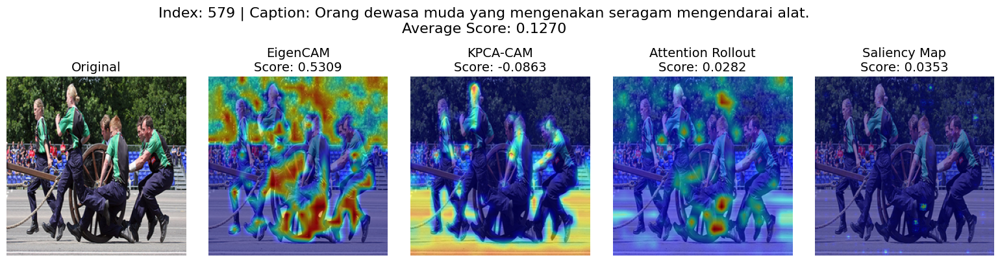

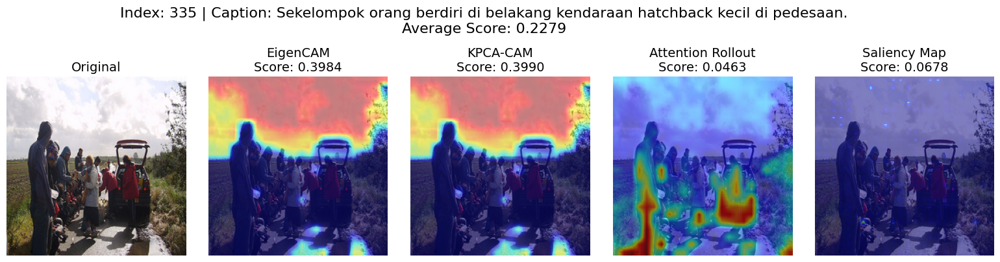

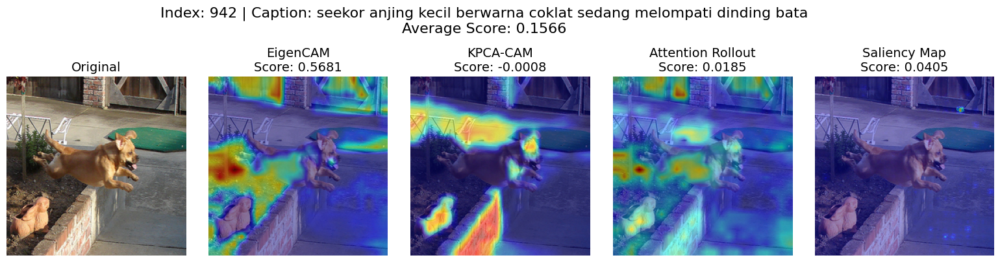

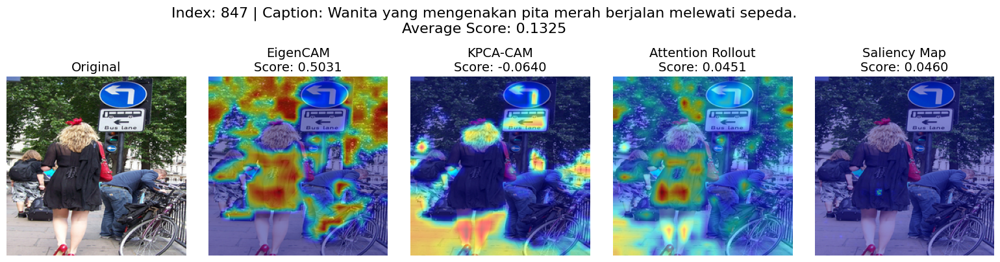

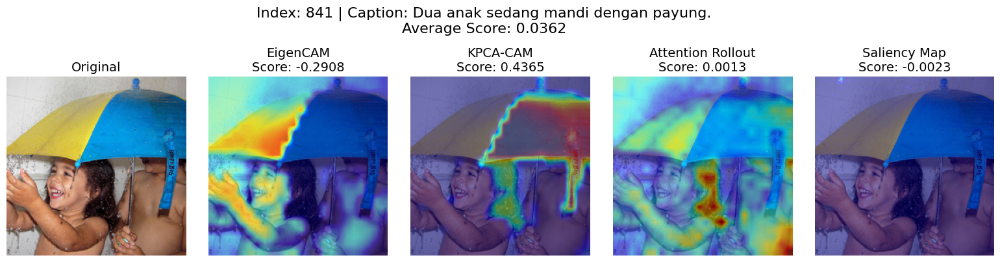

...

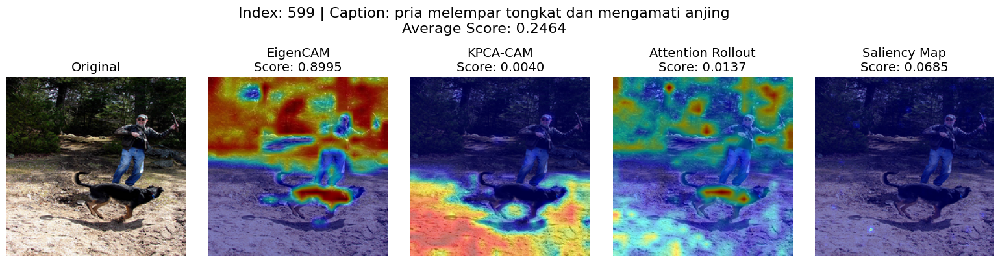

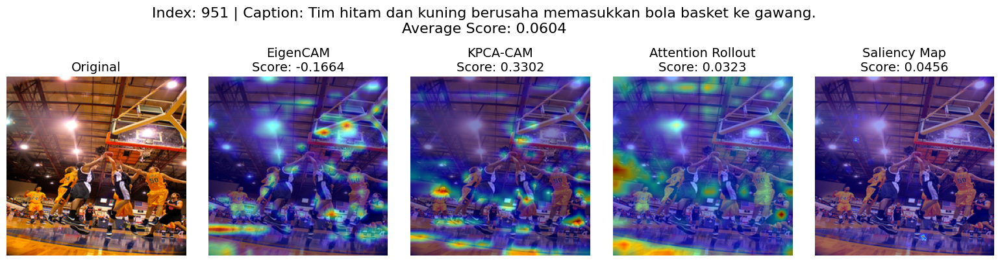

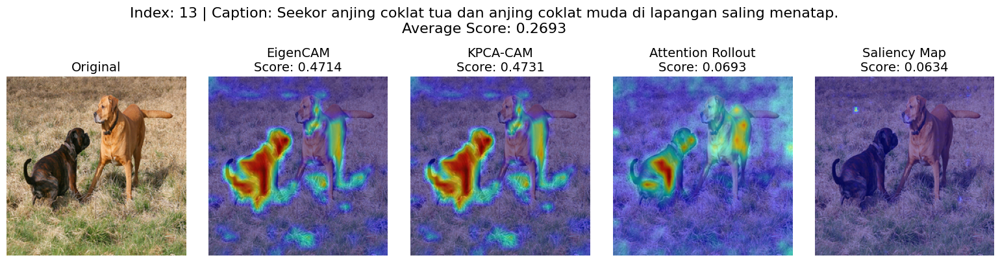

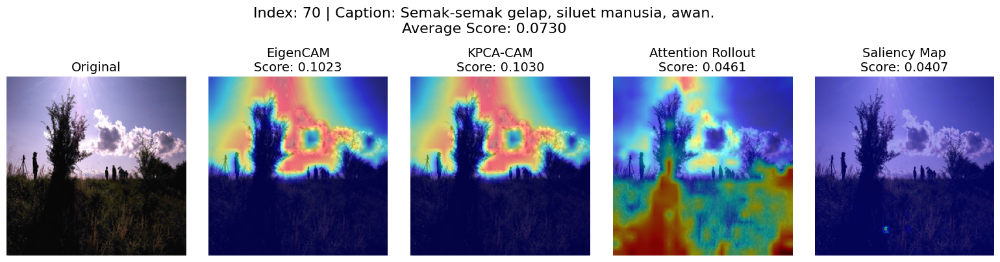

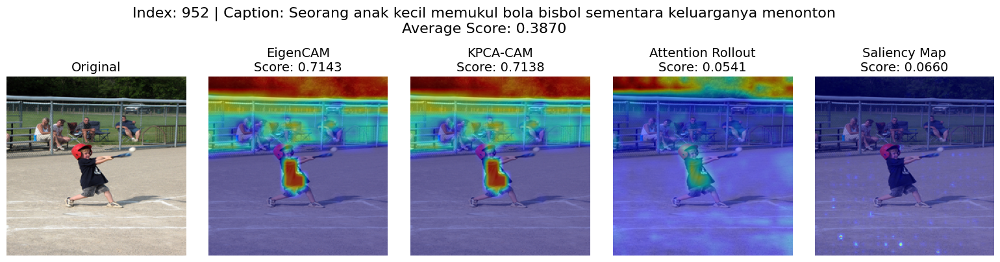

Plotting visualizations for 5 selected samples...


Generating Visualizations:   0%|          | 0/5 [00:00<?, ?it/s]

IndexError: single positional indexer is out-of-bounds

In [13]:
# === Contoh Penggunaan ===
# 1. Hitung skor untuk seluruh dataframe
df_with_scores = compute_cam_scores_all(df[0:1000], model, processor, device)
df_with_scores.to_csv('cam_scores_results.csv', index=False)

# 2. Analisis skor
df_analyzed = analyze_cam_scores(df_with_scores)

# 3. Plot visualizations untuk sampel terpilih
# Opsi 1: Random sampling
plot_cam_visualizations(df_with_scores, model, processor, device, num_samples=20)

# Opsi 2: Pilih indeks spesifik
# selected_indices = [0, 10, 25, 50, 99]  # Contoh indeks
# plot_cam_visualizations(df_with_scores, model, processor, device, selected_indices=selected_indices)

# Opsi 3: Plot best dan worst performers
top_indices = df_with_scores.nlargest(3, 'Average_Score').index.tolist()
bottom_indices = df_with_scores.nsmallest(2, 'Average_Score').index.tolist()
plot_cam_visualizations(df_with_scores, model, processor, device, 
                       selected_indices=top_indices + bottom_indices)

In [ ]:
df_with_scores

In [ ]:
# # === PROSES SEMUA GAMBAR ===
# image_paths = df[["Image_Path", "Caption"]].values.tolist()
# image_paths = image_paths[0:10]
# n_imgs = len(image_paths)

# def plot_grid_cam(model, model_name=''):
#     target_layer = model.vision_model.embeddings.patch_embedding
#     wrapped_model = BlipPatchWrapper(target_layer)
#     fig, axs = plt.subplots(n_imgs, 5, figsize=(20, 5 * n_imgs))
    
#     if n_imgs == 1: axs = [axs]  # handle single row
#     for row, (image_path, original_caption) in enumerate(tqdm(image_paths, desc="Processing images")):
#         # try:
#         # Load & preprocess image
#         image = Image.open(image_path).convert("RGB")
#         inputs = processor(images=image, return_tensors="pt").to(device)
#         input_tensor = inputs["pixel_values"]
    
#         with torch.no_grad():
#             caption_ids = model.generate(**inputs)
#             caption = processor.batch_decode(caption_ids, skip_special_tokens=True)[0]
    
#         rgb_image = input_tensor[0].detach().cpu().permute(1, 2, 0).numpy()
#         rgb_image = (rgb_image - rgb_image.min()) / (rgb_image.max() - rgb_image.min())
    
#         # === CAMs ===
#         cam_eigen = EigenCAM(model=wrapped_model, target_layers=[target_layer])
#         cam_kpca = KPCA_CAM(model=wrapped_model, target_layers=[target_layer])
#         grayscale_eigen = cam_eigen(input_tensor=input_tensor)[0]
#         grayscale_kpca = cam_kpca(input_tensor=input_tensor)[0]
#         vis_eigen = show_cam_on_image(rgb_image, grayscale_eigen, use_rgb=True)
#         vis_kpca = show_cam_on_image(rgb_image, grayscale_kpca, use_rgb=True)
    
#         # === Attention Rollout ===
#         rollout_map = compute_attention_rollout(model, input_tensor)
#         patch_res = int(np.sqrt(rollout_map.shape[0]))
#         rollout_map = rollout_map[:patch_res**2].reshape(patch_res, patch_res).numpy()
#         rollout_map = (rollout_map - rollout_map.min()) / (rollout_map.max() - rollout_map.min())
#         rollout_map_resized = cv2.resize(rollout_map, (rgb_image.shape[1], rgb_image.shape[0]))
#         vis_rollout = show_cam_on_image(rgb_image, rollout_map_resized, use_rgb=True)
    
#         # === Saliency Map ===
#         saliency = Saliency(forward_fn)
#         input_tensor.requires_grad_()
#         sal_attr = saliency.attribute(input_tensor)
#         sal_map = sal_attr[0].detach().cpu().permute(1, 2, 0).numpy()
#         sal_map = np.mean(np.abs(sal_map), axis=-1)
#         sal_map = (sal_map - sal_map.min()) / (sal_map.max() - sal_map.min())
#         vis_sal = show_cam_on_image(rgb_image, sal_map, use_rgb=True)
    
#         # === Evaluation ===
#         score_eigen = evaluate_cam_drop(model, input_tensor.clone(), grayscale_eigen)
#         score_kpca = evaluate_cam_drop(model, input_tensor.clone(), grayscale_kpca)
#         score_rollout = evaluate_cam_drop(model, input_tensor.clone(), rollout_map_resized)
#         score_sal = evaluate_cam_drop(model, input_tensor.clone(), sal_map)
        
#         # === Plot ===
#         axs[row][0].imshow(rgb_image)
#         axs[row][0].set_title("Original", fontsize=18)
#         axs[row][1].imshow(vis_eigen)
#         axs[row][1].set_title(f"EigenCAM\nScore = {score_eigen:.4f}" if score_eigen is not None else "EigenCAM\n(N/A)", fontsize=18)
#         axs[row][2].imshow(vis_kpca)
#         axs[row][2].set_title(f"KPCA-CAM\nScore = {score_kpca:.4f}" if score_kpca is not None else "KPCA-CAM\n(N/A)", fontsize=18)
#         axs[row][3].imshow(vis_rollout)
#         axs[row][3].set_title(f"Attention Rollout\nScore = {score_rollout:.4f}" if score_rollout is not None else "Attention Rollout\n(N/A)", fontsize=18)
#         axs[row][4].imshow(vis_sal)
#         axs[row][4].set_title(f"Saliency Map\nScore = {score_sal:.4f}" if score_sal is not None else "Saliency Map\n(N/A)", fontsize=18)
    
#         for ax in axs[row]:
#             ax.axis("off")
    
#         # === Tambahkan caption di tengah baris (di luar grid) ===
#         fig.text(
#             0.5,
#             1 - ((row + 1) / n_imgs) + 0.01,
#             f"Generated: {shorten(caption)} | GT: {shorten(original_caption)}",
#             ha="center", fontsize=18, wrap=True
#         )
    
#         # except Exception as e:
#         #     print(f"[ERROR] {image_path}: {e}")
    
#     plt.tight_layout()
#     plt.savefig(f'plot_grid_cam_{model_name}.png')
#     plt.show()

In [ ]:
# # model_path = "/kaggle/input/blip-flickr8k-indo-image-captioning/blip-image-captioning-large"
# model_path = "Salesforce/blip-image-captioning-base"
# processor = BlipProcessor.from_pretrained(model_path)
# model = BlipForConditionalGeneration.from_pretrained(model_path).eval().to(device)
# plot_grid_cam(model,'ingg')

In [ ]:
# model_path = "/kaggle/input/blip-flickr8k-indo-image-captioning/blip-image-captioning-large"
# # model_path = "Salesforce/blip-image-captioning-base"
# processor = BlipProcessor.from_pretrained(model_path)
# model = BlipForConditionalGeneration.from_pretrained(model_path).eval().to(device)
# plot_grid_cam(model,'indo')